In [1]:
import cv2
import hydra
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
cv2.__version__

'4.10.0'

In [3]:
hydra.__version__

'1.3.2'

In [4]:
torch.__version__

'2.5.0+cu124'

In [5]:
np.__version__

'1.26.4'

- **SAM**

```bash
git clone git@github.com:facebookresearch/segment-anything.git && cd segment-anything
pip install -e .
```
[Model Checkpoints](https://github.com/facebookresearch/segment-anything?tab=readme-ov-file#model-checkpoints)

- **SAM 2**

```bash
git clone https://github.com/facebookresearch/sam2.git && cd sam2
pip install -e .
```

[Model Checkpoints](https://github.com/facebookresearch/sam2/tree/main/checkpoints)

## Object masks from prompts with SAM

The Segment Anything Model (SAM) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt. 

> The `SamPredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

## Automatically generating object masks with SAM

Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.

> The class `SamAutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [6]:
def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 

        if borders:
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

### Example image

In [7]:
image = Image.open('data/planes.jpg')
image = np.array(image.convert("RGB"))

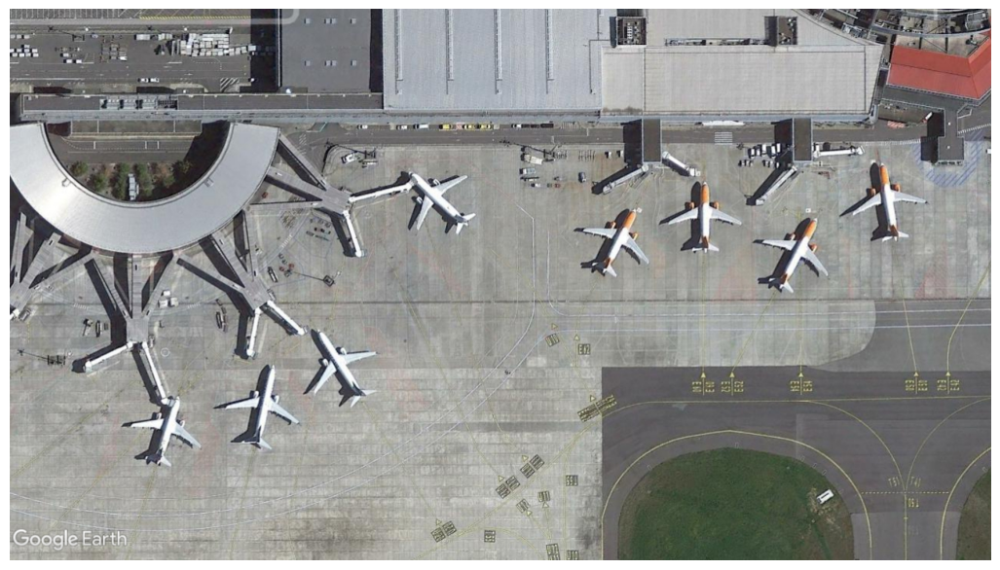

In [8]:
plt.figure(figsize=(13,11))
plt.imshow(image)
plt.axis('off')
plt.show()

### Selecting objects with SAM

Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point).

In [9]:
input_point = np.array([[550, 240]])
input_label = np.array([1])

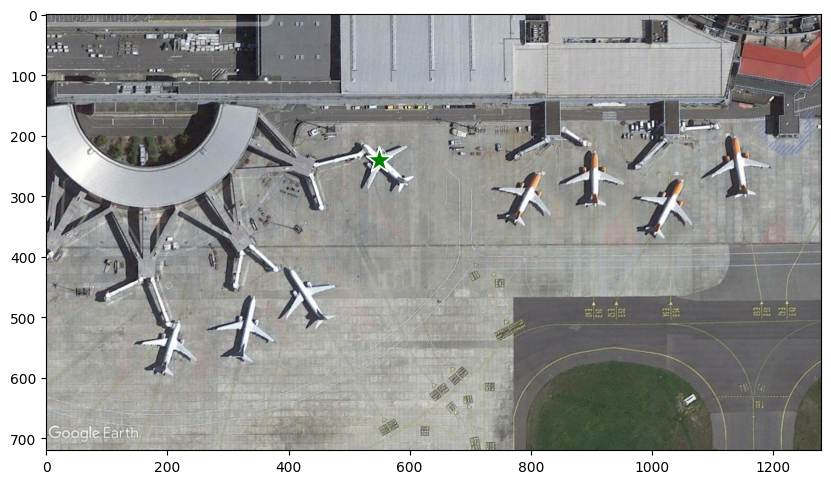

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

In [11]:
import warnings
warnings.filterwarnings('ignore')

In [12]:
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "data/sam_vit_l_0b3195.pth"
model_type = "vit_l"

device = "cpu" #"cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor_sam = SamPredictor(sam)

In [13]:
predictor_sam.set_image(image)

masks_sam, scores_sam, logits_sam = predictor_sam.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

(3, 720, 1280)


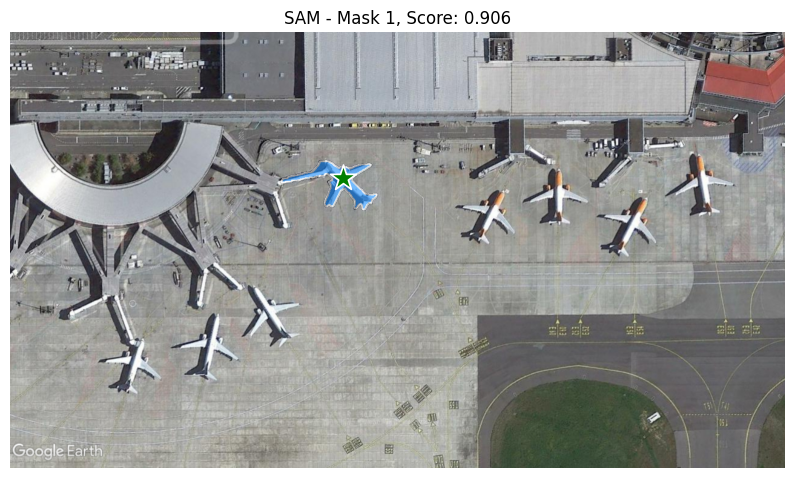

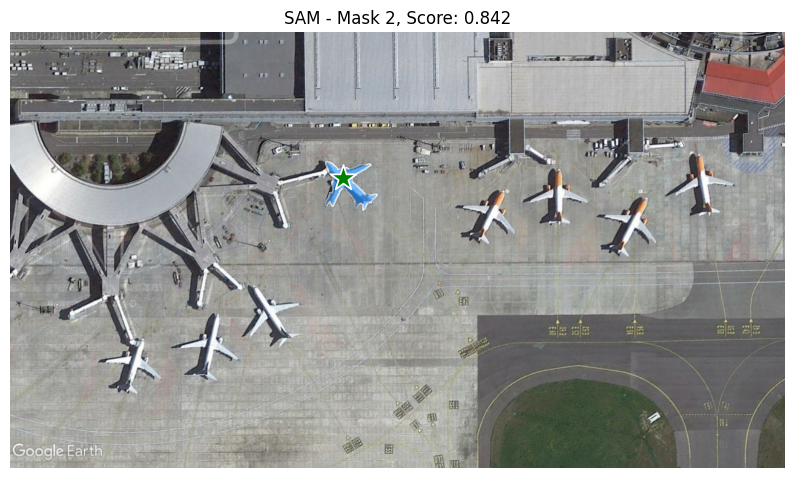

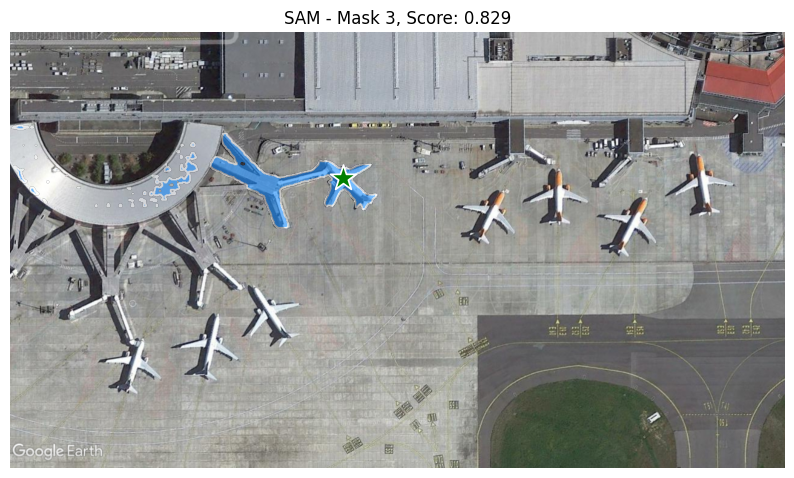

In [14]:
print(masks_sam.shape)  # (number_of_masks) x H x W

for i, (mask, score) in enumerate(zip(masks_sam, scores_sam)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"SAM - Mask {i+1}, Score: {score:.3f}", fontsize=12)
    plt.axis('off')
    plt.show()  

In [15]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

hydra.core.global_hydra.GlobalHydra.instance().clear()
hydra.initialize_config_module('data', version_base='1.2')

sam2_checkpoint = "data/sam2.1_hiera_large.pt"
model_cfg = "sam2.1_hiera_l.yaml"

device = "cpu"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor_sam2 = SAM2ImagePredictor(sam2_model)

In [16]:
predictor_sam2.set_image(image)

masks_sam2, scores_sam2, logits_sam2 = predictor_sam2.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

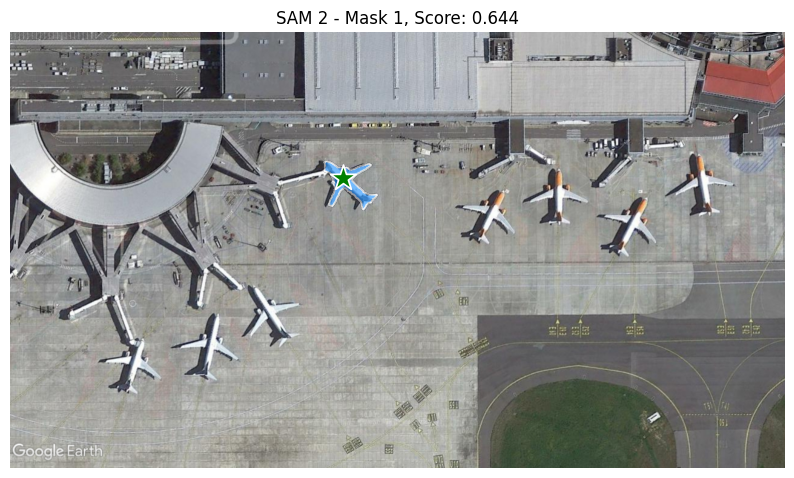

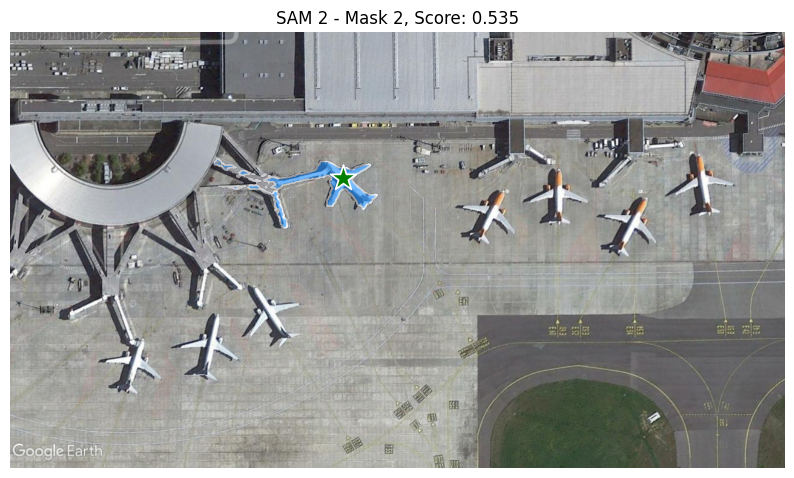

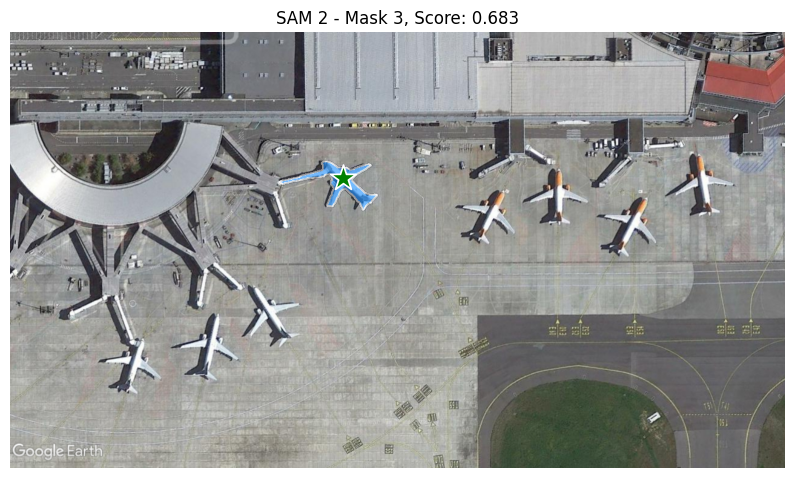

In [17]:
for i, (mask, score) in enumerate(zip(masks_sam2, scores_sam2)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"SAM 2 - Mask {i+1}, Score: {score:.3f}", fontsize=12)
    plt.axis('off')
    plt.show()  

### Specifying a specific object with additional points

In [18]:
input_point = np.array([[550, 240], [590, 280]])
input_label = np.array([1, 1])

mask_input = logits_sam2[np.argmax(scores_sam2), :, :]  # Choose the model's best mask

In [19]:
masks, _, _ = predictor_sam2.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)
masks.shape

(1, 720, 1280)

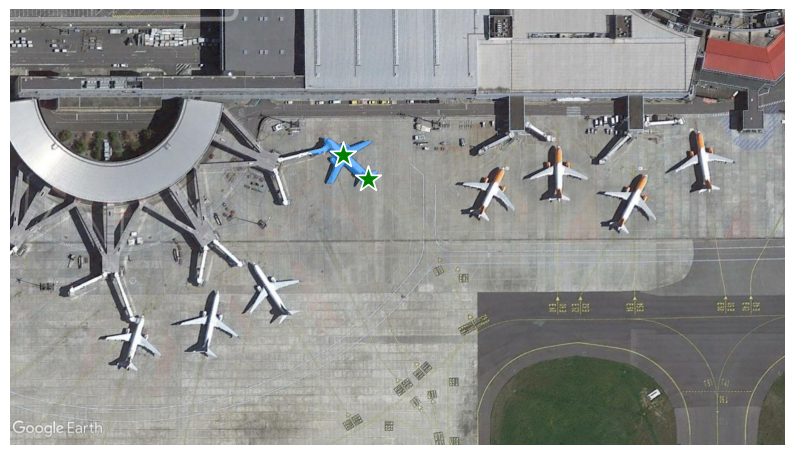

In [20]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca(), borders=False)
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

In [21]:
input_point = np.array([[550, 240], [500, 300]])
input_label = np.array([1, 0])

In [22]:
masks, _, _ = predictor_sam2.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

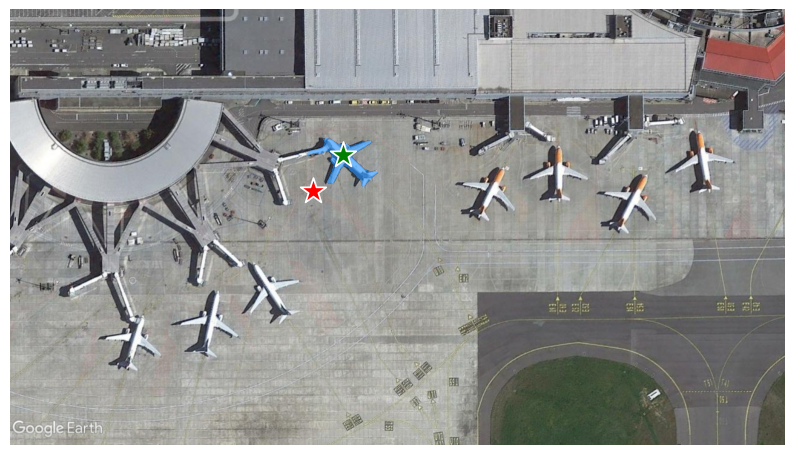

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca(), borders=False)
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

### Specifying a specific object with a box

In [24]:
input_box = np.array([500, 200, 600, 300])

In [25]:
masks, _, _ = predictor_sam2.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

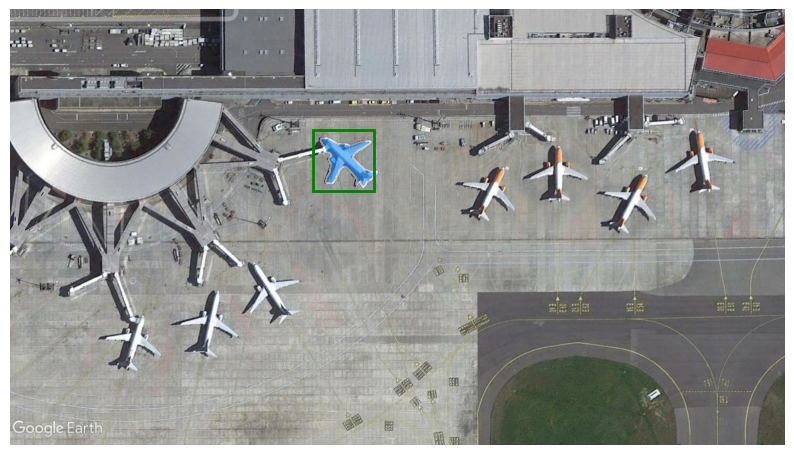

In [26]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

### Combining points and boxes

In [27]:
input_box = np.array([500, 200, 600, 300])
input_point = np.array([[500, 300]])
input_label = np.array([0])

In [28]:
masks, _, _ = predictor_sam2.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

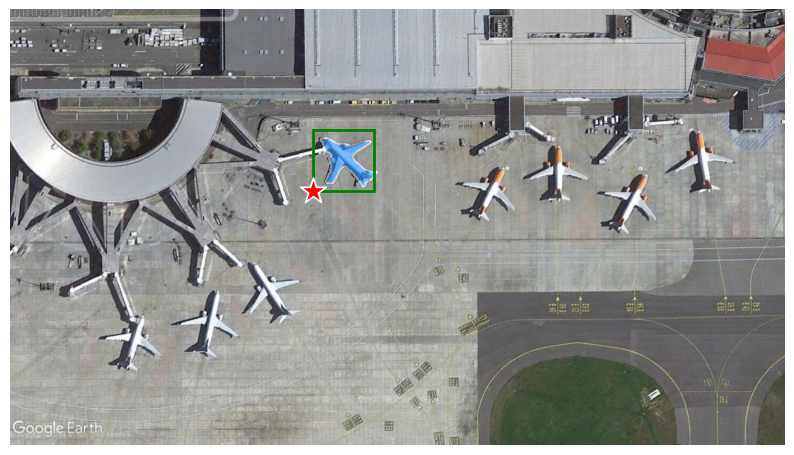

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

### Batched prompt inputs

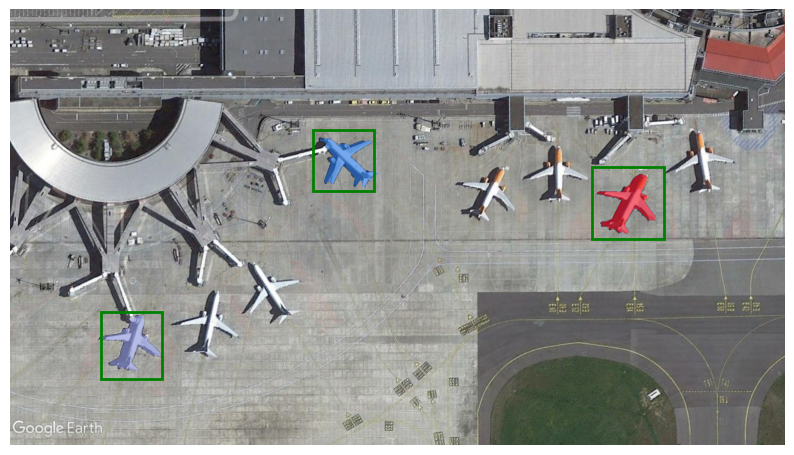

In [30]:
# SAM

input_boxes = torch.tensor([
    [500, 200, 600, 300],
    [960, 260, 1080, 380],
    [150, 500, 250, 610],
], device=predictor_sam.device)

transformed_boxes = predictor_sam.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor_sam.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True, borders=False)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

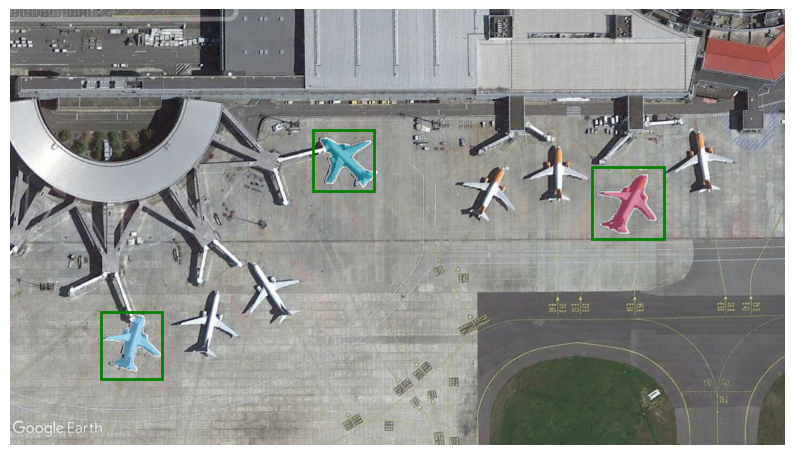

In [31]:
# SAM 2

input_boxes = np.array([
    [500, 200, 600, 300],
    [960, 260, 1080, 380],
    [150, 500, 250, 610],
])

masks, scores, _ = predictor_sam2.predict(
    point_coords=None,
    point_labels=None,
    box=input_boxes,
    multimask_output=False,
)

plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.squeeze(0), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box, plt.gca())
plt.axis('off')
plt.show()

### Automatic mask generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class.

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [32]:
from segment_anything import SamAutomaticMaskGenerator

mask_generator_sam = SamAutomaticMaskGenerator(sam)

In [33]:
masks_sam = mask_generator_sam.generate(image)

In [34]:
print(len(masks_sam))
print(masks_sam[0].keys())

96
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


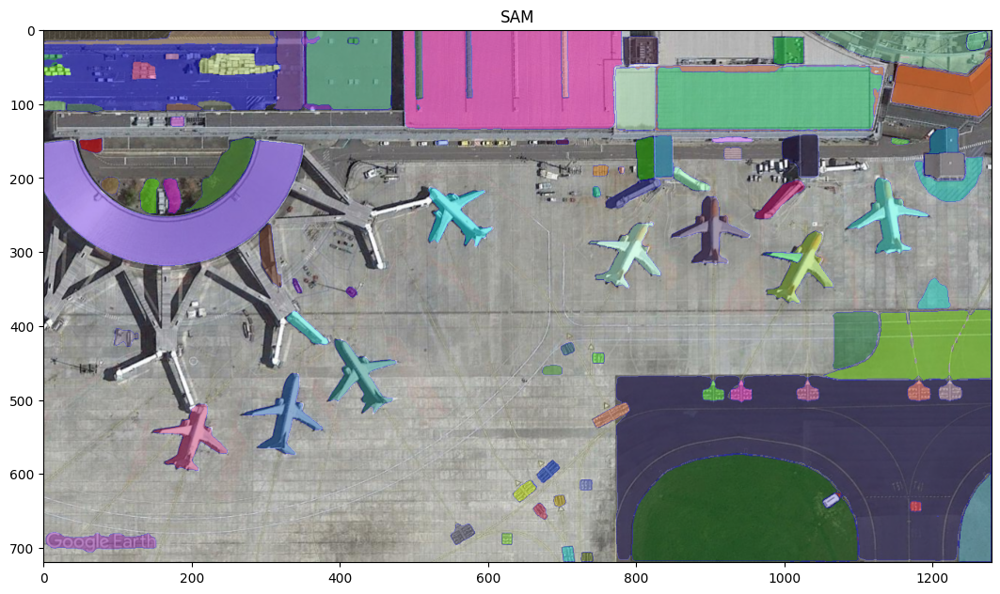

In [35]:
plt.figure(figsize=(13,11))
plt.imshow(image)
show_anns(masks_sam)
plt.title("SAM")
plt.show() 

In [36]:
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

mask_generator_sam2 = SAM2AutomaticMaskGenerator(
    model=sam2_model,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=25.0,
)

In [37]:
masks_sam2 = mask_generator_sam2.generate(image)

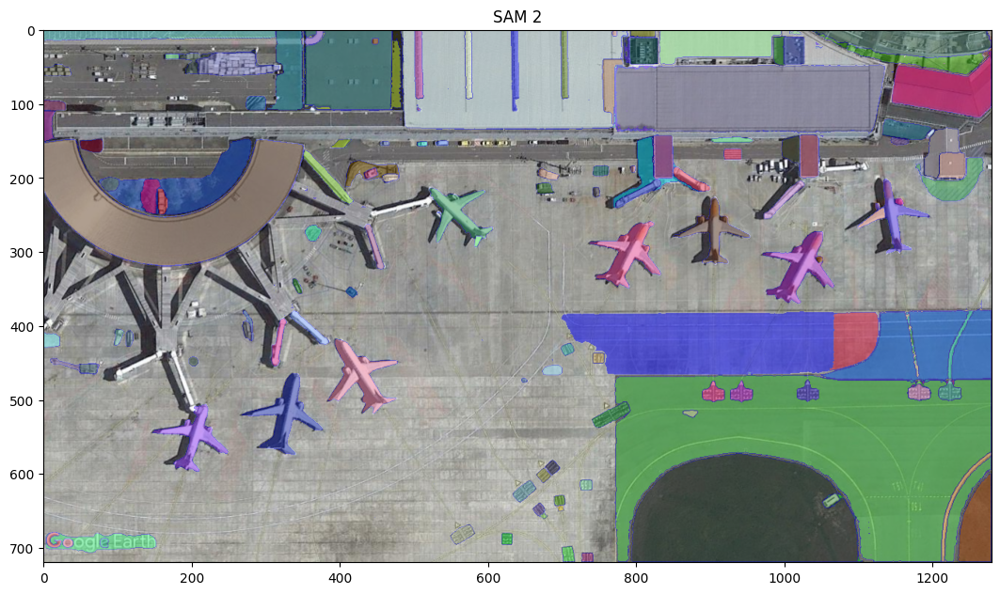

In [38]:
plt.figure(figsize=(13,11))
plt.imshow(image)
show_anns(masks_sam2)
plt.title("SAM 2")
plt.show() 